
# Train YOLOv12 Object detect behavior

---

[![Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/roboflow-ai/notebooks/blob/main/notebooks/train-yolov12-object-detection-model.ipynb)
[![arXiv](https://img.shields.io/badge/arXiv-2502.12524-b31b1b.svg)](https://arxiv.org/abs/2502.12524)
[![Roboflow](https://raw.githubusercontent.com/roboflow-ai/notebooks/main/assets/badges/roboflow-blogpost.svg)](https://blog.roboflow.com/train-yolov12-model)
[![GitHub](https://badges.aleen42.com/src/github.svg)](https://github.com/sunsmarterjie/yolov12)

[YOLOv12](https://github.com/sunsmarterjie/yolov12) is a newly proposed attention-centric variant of the YOLO family that focuses on incorporating efficient attention mechanisms into the backbone while preserving real-time performance. Instead of relying heavily on CNN-based architectures like its predecessors, YOLOv12 introduces a simple yet powerful “area attention” module, which strategically partitions the feature map to reduce the quadratic complexity of full self-attention. It also adopts residual efficient layer aggregation networks (R-ELAN) to enhance feature aggregation and training stability, especially for larger models. These innovations, together with refinements such as scaled residual connections and a reduced MLP ratio, enable YOLOv12 to harness the benefits of attention (e.g., better global context modeling) without sacrificing speed.

![yolov12-area-attention](https://media.roboflow.com/notebooks/examples/yolov12-area-attention.png)

Compared to prior YOLO iterations (e.g., YOLOv10, YOLOv11, and YOLOv8), YOLOv12 achieves higher detection accuracy with competitive or faster inference times across all model scales. Its five sizes—N, S, M, L, and X—range from 2.6M to 59.1M parameters, striking a strong accuracy–speed balance. For instance, the smallest YOLOv12-N surpasses other “nano” models by over 1% mAP with latency around 1.6 ms on a T4 GPU, and the largest YOLOv12-X achieves 55.2% mAP, comfortably outscoring comparable real-time detectors such as RT-DETR and YOLOv11-X . By matching or exceeding state-of-the-art accuracy while remaining fast, YOLOv12 represents a notable step forward for attention-based real-time object detection.

![yolov12-metrics](https://storage.googleapis.com/com-roboflow-marketing/notebooks/examples/yolov12-metrics.png)

- Latancy là thời gian chễ. Nếu càng thấp thì model tốt
- FLOPs là số lượng ghép dấu chấm động mà mô hình thực hiện để
xử lý ảnh. Chỉ số này thể hiện mức độ phức tạp của mô hình
- Ms COCO mAP độ chính xác trung bình ngưỡng

## 1. Introduction and Environment setup

### 1.1 Kiến trúc YOLOv12

* Tham chieu:

### 1.2 Check GPU availability

**NOTE:** **YOLOv12 leverages FlashAttention to speed up attention-based computations, but this feature requires an Nvidia GPU built on the Ampere architecture or newer—for example, GPUs like the RTX 3090, RTX 3080, or even the Nvidia L4 meet this requirement.**

Let's make sure that we have access to GPU. We can use `nvidia-smi` command to do that. In case of any problems navigate to `Edit` -> `Notebook settings` -> `Hardware accelerator`, set it to `GPU`, and then click `Save`.

In [1]:
!nvidia-smi

Wed Mar 12 19:16:23 2025       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.216.01             Driver Version: 535.216.01   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA A30                     Off | 00000000:D8:00.0 Off |                    0 |
| N/A   44C    P0              35W / 165W |   1830MiB / 24576MiB |      0%      Default |
|                                         |                      |             Disabled |
+-----------------------------------------+----------------------+--

In [2]:
import torch
print("CUDA Available:", torch.cuda.is_available())
print("Torch Version:", torch.__version__)
print("GPU Name:", torch.cuda.get_device_name(0) if torch.cuda.is_available() else "No GPU detected")


CUDA Available: True
Torch Version: 2.6.0+cu118
GPU Name: NVIDIA A30


### 1.3 Kết nối tới google drive tải flash-attn

In [5]:
# 1. Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# 2. Di chuyển đến thư mục bạn muốn lưu trong Drive
%cd /content/drive/MyDrive

ModuleNotFoundError: No module named 'google.colab'

In [5]:
!pip install flash-attn --only-binary :all:

Defaulting to user installation because normal site-packages is not writeable
ERROR: Could not find a version that satisfies the requirement flash-attn (from versions: none)
ERROR: No matching distribution found for flash-attn


### 1.4 Clone ngay tại thư mục đang làm việc ( Git, flash-attn roboflow)

In [9]:
!git clone https://github.com/sunsmarterjie/yolov12.git

Cloning into 'yolov12'...
remote: Enumerating objects: 956, done.
remote: Counting objects: 100% (234/234), done.
remote: Compressing objects: 100% (54/54), done.
remote: Total 956 (delta 213), reused 181 (delta 180), pack-reused 722 (from 1)
Receiving objects: 100% (956/956), 1.59 MiB | 1.36 MiB/s, done.
Resolving deltas: 100% (455/455), done.


In [22]:
!pip install git+https://github.com/sunsmarterjie/yolov12.git roboflow supervision flash-attn

Defaulting to user installation because normal site-packages is not writeable
  Cloning https://github.com/sunsmarterjie/yolov12.git to /tmp/pip-req-build-cnr8td6d
  Running command git clone --filter=blob:none --quiet https://github.com/sunsmarterjie/yolov12.git /tmp/pip-req-build-cnr8td6d
  Resolved https://github.com/sunsmarterjie/yolov12.git to commit e011b1012ccbd6f208afe29dc21e251920c76784
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Using cached flash_attn-2.7.4.post1.tar.gz (6.0 MB)
  Preparing metadata (setup.py) ... error
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> [11 lines of output]
      
      
      torch.__version__  = 2.6.0+cu118
      
      
      Traceback (most recent call last):
        File "<string>", line 2, in <module>
        File "<pip-setuptools-caller>", line 34, in <module>
        File "/t

#### 1.4.1  Download dataset from Roboflow Universe

In [16]:
!pip install roboflow supervision flash-attn==2.0.2

Defaulting to user installation because normal site-packages is not writeable
  Using cached supervision-0.25.1-py3-none-any.whl.metadata (14 kB)


In [25]:
import os
print(os.getcwd())

/home/minhnv/Documents/ntt/AiIot/FinalPorject/CodingYOLOv12


In [10]:
from roboflow import Roboflow
import os
import shutil

# Đường dẫn thư mục chứa dữ liệu tải về
dataset_path = "/hdd2/minhnv/CodingYOLOv12/Dataset"
# Khởi tạo Roboflow
%cd "/hdd2/minhnv/CodingYOLOv12/Dataset"

rf = Roboflow(api_key="JutTY4tTGxWHjEqJiZNb")
project = rf.workspace("nhan-dien-hanh-vi-trong-lop-hoc").project("student-behavior-recognition")

# Chọn phiên bản dataset
version = project.version(6)
dataset = version.download("yolov12")

print(f"Dữ liệu đã tải về: {dataset.location}")

# # Đường dẫn lưu trữ
# drive_dataset_path = dataset_path

# # Tạo thư mục nếu chưa tồn tại
# os.makedirs(drive_dataset_path, exist_ok=True)

# # Sao chép dữ liệu sang thư mục lưu trữ
# shutil.copytree(dataset.location, drive_dataset_path, dirs_exist_ok=True)
# print(f"Đã sao chép dataset đến: {drive_dataset_path}")

# # Hàm tính dung lượng thư mục
# def get_directory_size(directory):
#     total_size = 0
#     for dirpath, dirnames, filenames in os.walk(directory):
#         for filename in filenames:
#             filepath = os.path.join(dirpath, filename)
#             total_size += os.path.getsize(filepath)
#     return total_size

# # Tính và hiển thị dung lượng
# dataset_size_mb = get_directory_size(drive_dataset_path) / (1024 * 1024)
# print(f"Dung lượng dữ liệu tải về: {dataset_size_mb:.2f} MB")

# # Kiểm tra cấu trúc thư mục
# import subprocess
# print("\nCấu trúc thư mục:")
# subprocess.run(f"tree {drive_dataset_path}", shell=True)


/hdd2/minhnv/CodingYOLOv12/Dataset
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Student-Behavior-Recognition-6 in yolov12:: 100%|██████████| 7094/7094 [00:01<00:00, 4493.33it/s]


Dữ liệu đã tải về: /hdd2/minhnv/CodingYOLOv12/Dataset/Student-Behavior-Recognition-6


In [14]:
# In ra cấu trúc thư mục để kiểm tra
import subprocess
print("\nCấu trúc thư mục:")
subprocess.run(f"tree {drive_dataset_path}", shell=True)


Cấu trúc thư mục:


NameError: name 'drive_dataset_path' is not defined

In [171]:
!ls {drive_dataset_path}

13800.70s - pydevd: Sending message related to process being replaced timed-out after 5 seconds
Student-Behavior-Recognition-1	Student-Behavior-Recognition-2


**NOTE:** We need to make a few changes to our downloaded dataset so it will work with YOLOv12. Run the following bash commands to prepare your dataset for training by updating the relative paths in the `data.yaml` file, ensuring it correctly points to the subdirectories for your dataset's `train`, `test`, and `valid` subsets.

In [29]:
!sed -i '$d' {drive_dataset_path}/data.yaml
!echo -e "test: ../test/images\ntrain: ../train/images\nval: ../valid/images" >> {drive_dataset_path}/data.yaml

In [30]:
!cat {drive_dataset_path}/data.yaml

train: ../train/images
val: ../valid/images
test: ../test/images

nc: 4
names: ['drinking', 'sleeping', 'using_computer', 'using_phone']

roboflow:
  workspace: nhan-dien-hanh-vi-trong-lop-hoc
  project: student-behavior-recognition
  version: 1
  license: CC BY 4.0
test: ../test/images
train: ../train/images
val: ../valid/images


## 2. Thống kê ảnh
- Thống kê về phân bổ số lượng object file train, valid, test
- Thống kê số lượng theo lớp
- Thống kê kích thước ảnh

### 2.1 Data yaml path

- Student-Behavior-Recognition-2 : Version ngày 11-03-2025 có những bức ảnh using computer chỉ gán mỗi tay không gán cả người

In [5]:
data_yaml_path = "/home/minhnv/Documents/ntt/AiIot/FinalPorject/CodingYOLOv12/Dataset/Student-Behavior-Recognition-5/data.yaml"

#### 2.1.1 Hàm lấy đường dẫn duy nhất ( Quy tắc đường dẫn )

In [6]:
from datetime import datetime
import os
def get_unique_path(base_path):
    """
    Tạo đường dẫn duy nhất bằng cách thêm phiên bản nếu thư mục đã tồn tại

    Args:
        base_path (str): Đường dẫn gốc muốn tạo

    Returns:
        str: Đường dẫn duy nhất
    """
    # Nếu thư mục chưa tồn tại, trả về ngay
    if not os.path.exists(base_path):
        return f"{base_path}_ver{1}"

    # Nếu đã tồn tại, tìm phiên bản tiếp theo
    version = 2
    while True:
        versioned_path = f"{base_path}_ver{version}"
        if not os.path.exists(versioned_path):
            return versioned_path
        version += 1
        
# Tạo đường dẫn lưu trữ với thư mục theo ngày
current_date = datetime.now().strftime("%d%m%Y_%H%M%S")
nameYoloFamily = 'yolov12s'
### base
ver_dataset = 5
base_save_path = f'/home/minhnv/Documents/ntt/AiIot/FinalPorject/CodingYOLOv12/StaticModels/{nameYoloFamily}{current_date}_ver-dataset{ver_dataset}/'

# Lấy đường dẫn duy nhất ----------------------------------Đường dẫn này cũng là quan trọng. Vì các báo cáo dưới đều càn đến
unique_save_path = get_unique_path(base_save_path)
# Tạo thư mục
os.makedirs(unique_save_path, exist_ok=True)

### 2.2 Thống kê số lượng đối tượng và kích thước ảnh ( Chưa lưu vào folder)

1. Đọc file YAML:

Classes: ['drinking', 'raising_hand', 'sleeping', 'using_computer', 'using_phone', 'writing']

2. Cấu trúc thư mục:
Root path: /home/minhnv/Documents/ntt/AiIot/FinalPorject/CodingYOLOv12/Dataset/Student-Behavior-Recognition-5
Nội dung root:
['README.roboflow.txt', 'train', 'valid', 'test', 'data.yaml', 'README.dataset.txt']

Mẫu nội dung labels:
4 0.5747395833333333 0.9486111111111111 0.0546875 0.09537037037037037
4 0.8236979166666667 0.8981481481481481 0.06302083333333333 0.15
3 0.3533854166666667 0.2439814814814815 0.209375 0.40555555555555556
3 0.2140625 0.15231481481481482 0.21875 0.30462962962962964
3 0.70546875 0.8662037037037037 0.11302083333333333 0.17962962962962964
3 0.4765625 0.8722222222222222 0.08385416666666666 0.14074074074074075
3 0.58984375 0.18981481481481483 0.07083333333333333 0.08425925925925926
3 0.7963541666666667 0.2412037037037037 0.06041666666666667 0.08055555555555556
4 0.6002604166666666 0.5962962962962963 0.071875 0.14074074074074075
3 0.

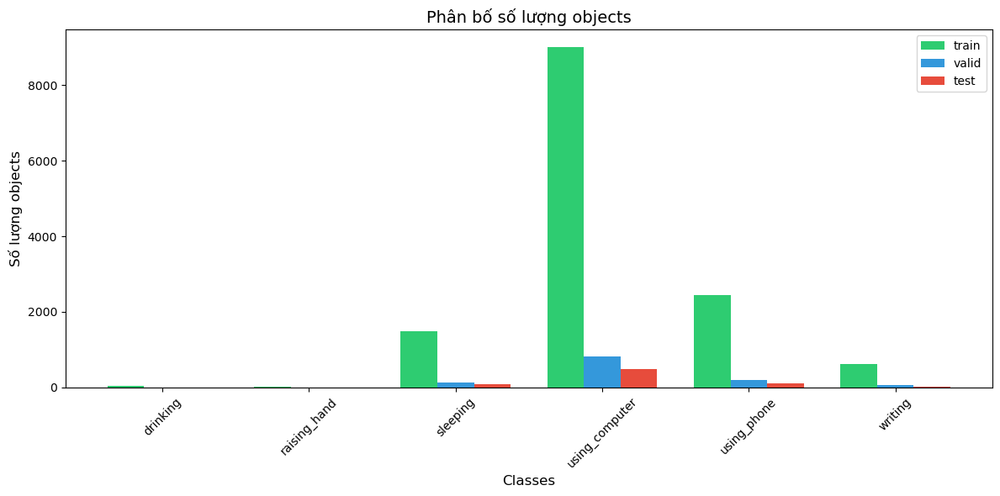


Hiển thị ảnh mẫu:


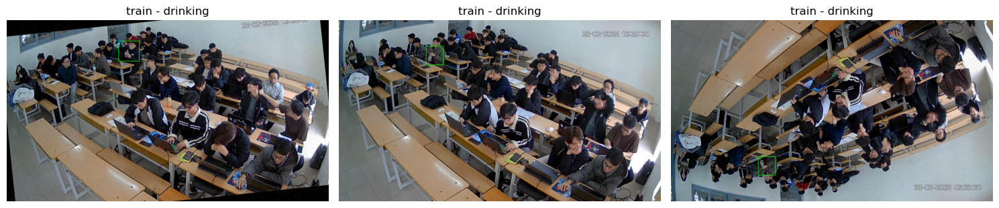

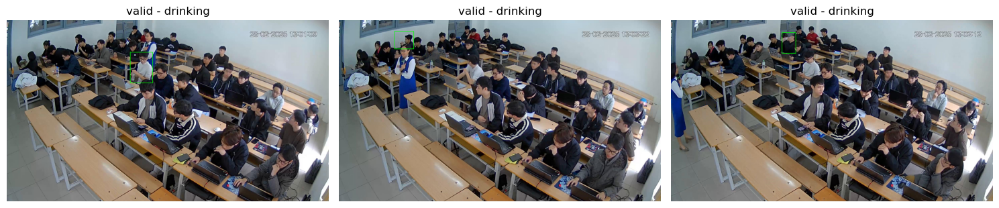

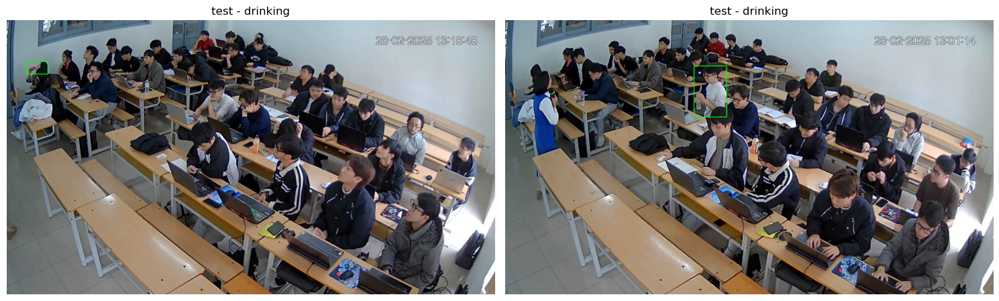

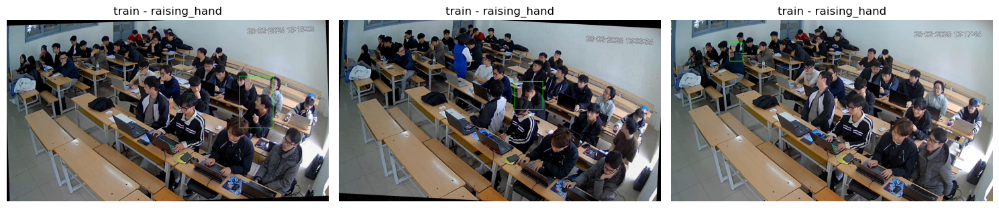

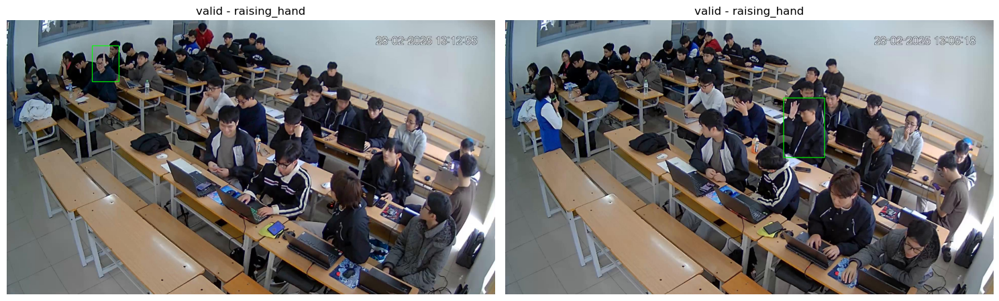

...

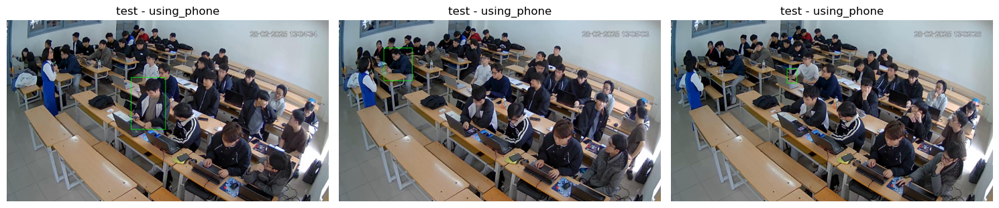

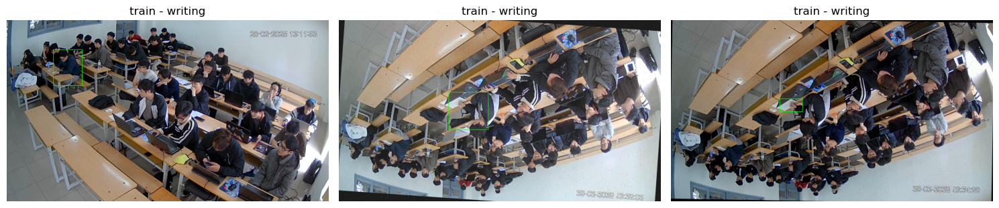

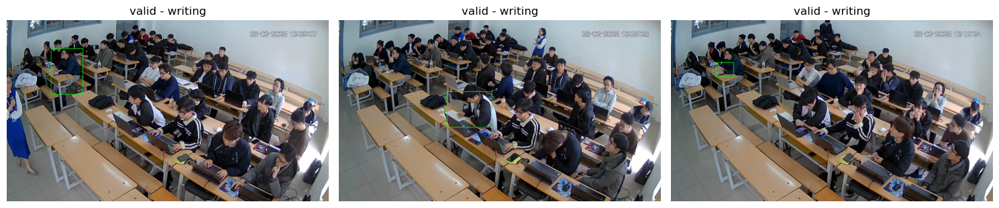

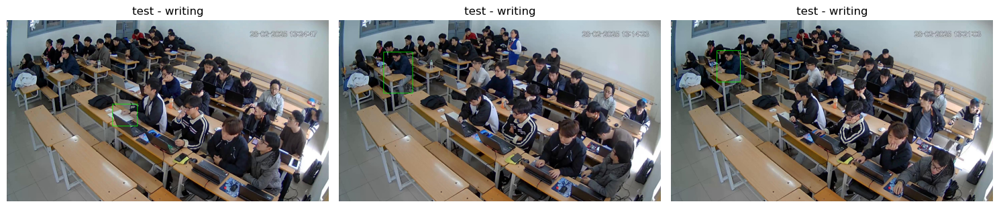

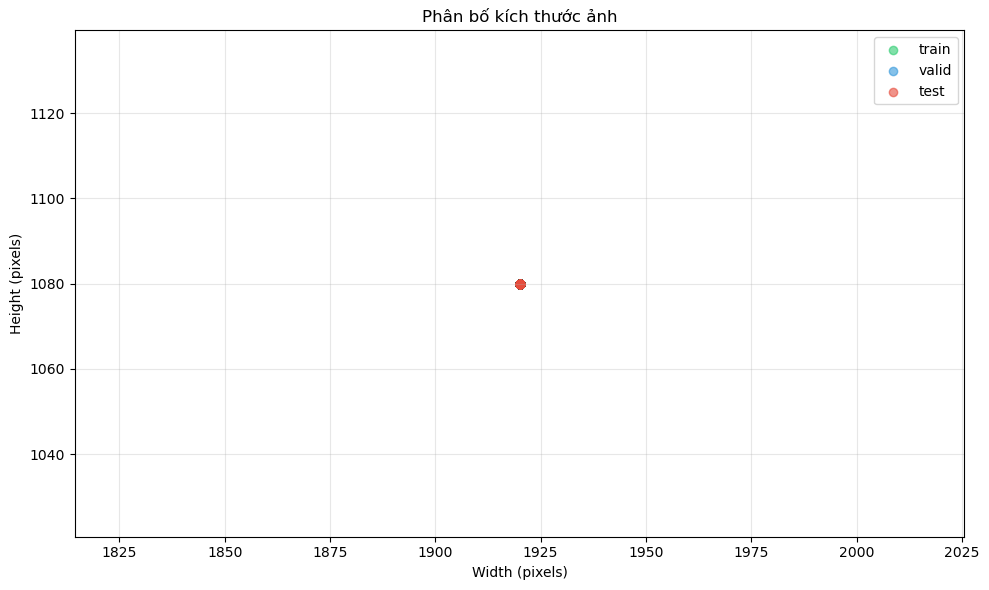


Thống kê chi tiết:

=== TRAIN ===

Class: using_computer
- Số lượng: 9010
- Kích thước trung bình: 1920x1080

Class: using_phone
- Số lượng: 2436
- Kích thước trung bình: 1920x1080

Class: sleeping
- Số lượng: 1482
- Kích thước trung bình: 1920x1080

Class: writing
- Số lượng: 624
- Kích thước trung bình: 1920x1080

Class: drinking
- Số lượng: 42
- Kích thước trung bình: 1920x1080

Class: raising_hand
- Số lượng: 12
- Kích thước trung bình: 1920x1080

Tổng số objects: 13606

=== VALID ===

Class: using_computer
- Số lượng: 829
- Kích thước trung bình: 1920x1080

Class: sleeping
- Số lượng: 138
- Kích thước trung bình: 1920x1080

Class: using_phone
- Số lượng: 199
- Kích thước trung bình: 1920x1080

Class: writing
- Số lượng: 58
- Kích thước trung bình: 1920x1080

Class: drinking
- Số lượng: 3
- Kích thước trung bình: 1920x1080

Class: raising_hand
- Số lượng: 2
- Kích thước trung bình: 1920x1080

Tổng số objects: 1229

=== TEST ===

Class: using_computer
- Số lượng: 485
- Kích thước t

In [9]:
import os
import yaml
from collections import defaultdict
from PIL import Image
import matplotlib.pyplot as plt
import cv2
import random
import seaborn as sns
import numpy as np

def analyze_dataset(yaml_path):
    # 1. Đọc và in thông tin YAML
    print("1. Đọc file YAML:")
    with open(yaml_path, 'r') as f:
        data = yaml.safe_load(f)
    # print(f"Nội dung YAML: {data}")

    root_path = os.path.dirname(yaml_path)
    class_names = data['names']
    print(f"\nClasses: {class_names}")

    # 2. Kiểm tra cấu trúc thư mục
    print("\n2. Cấu trúc thư mục:")
    print(f"Root path: {root_path}")
    print("Nội dung root:")
    print(os.listdir(root_path))

    # 3. Thu thập thống kê
    stats = {
        'train': defaultdict(lambda: {'count': 0, 'sizes': [], 'examples': []}),
        'valid': defaultdict(lambda: {'count': 0, 'sizes': [], 'examples': []}),
        'test': defaultdict(lambda: {'count': 0, 'sizes': [], 'examples': []})
    }

    for split in ['train', 'valid', 'test']:
        images_dir = os.path.join(root_path, split, 'images')
        labels_dir = os.path.join(root_path, split, 'labels')

        # print(f"\nXử lý {split} set:")
        # print(f"Images dir: {images_dir}")
        # print(f"Labels dir: {labels_dir}")

        if not os.path.exists(images_dir) or not os.path.exists(labels_dir):
            print(f"Không tìm thấy thư mục images hoặc labels cho {split}")
            continue

        # In mẫu nội dung labels
        label_files = os.listdir(labels_dir)
        if label_files:
            print("\nMẫu nội dung labels:")
            for label_file in label_files[:2]:
                # print(f"\nFile: {label_file}")
                with open(os.path.join(labels_dir, label_file), 'r') as f:
                    print(f.read())

        # Xử lý từng ảnh
        for img_file in os.listdir(images_dir):
            if img_file.endswith(('.jpg', '.jpeg', '.png')):
                img_path = os.path.join(images_dir, img_file)
                label_path = os.path.join(labels_dir, img_file.rsplit('.', 1)[0] + '.txt')

                if os.path.exists(label_path):
                    try:
                        img = cv2.imread(img_path)
                        if img is None:
                            print(f"Không thể đọc ảnh: {img_path}")
                            continue
                        height, width = img.shape[:2]

                        with open(label_path, 'r') as f:
                            label_content = f.read().strip()
                            if label_content:
                                for line in label_content.split('\n'):
                                    try:
                                        parts = line.strip().split()
                                        if len(parts) == 5:
                                            class_id = int(parts[0])
                                            if class_id < len(class_names):
                                                class_name = class_names[class_id]
                                                stats[split][class_name]['count'] += 1
                                                stats[split][class_name]['sizes'].append((width, height))
                                                stats[split][class_name]['examples'].append((img_path, line))
                                        # else:
                                        #     # print(f"Format label không đúng: {line}")
                                    except ValueError as e:
                                        print(f"Lỗi parse label: {str(e)}")
                    except Exception as e:
                        print(f"Lỗi xử lý {img_path}: {str(e)}")

    # 4. Visualize kết quả
    # 4.1 Biểu đồ số lượng objects
    plt.figure(figsize=(12, 6))
    splits = list(stats.keys())
    x = np.arange(len(class_names))
    width = 0.25

    colors = ['#2ecc71', '#3498db', '#e74c3c']
    for i, (split, color) in enumerate(zip(splits, colors)):
        counts = [stats[split][class_name]['count'] for class_name in class_names]
        plt.bar(x + i*width, counts, width, label=split, color=color)

    plt.xlabel('Classes', fontsize=12)
    plt.ylabel('Số lượng objects', fontsize=12)
    plt.title('Phân bố số lượng objects', fontsize=14)
    plt.xticks(x + width, class_names, rotation=45)
    plt.legend()
    plt.tight_layout()
    plt.show()

    # 4.2 Hiển thị ảnh mẫu
    def plot_samples(split, class_name, num_samples=3):
        examples = stats[split][class_name]['examples']
        if not examples:
            return

        samples = random.sample(examples, min(num_samples, len(examples)))
        fig, axes = plt.subplots(1, len(samples), figsize=(15, 5))
        if len(samples) == 1:
            axes = [axes]

        for ax, (img_path, label) in zip(axes, samples):
            img = cv2.imread(img_path)
            if img is None:
                print(f"Không thể đọc ảnh: {img_path}")
                continue

            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            height, width = img.shape[:2]

            try:
                parts = label.strip().split()
                if len(parts) == 5:
                    _, x_center, y_center, w, h = map(float, parts)

                    x1 = int((x_center - w/2) * width)
                    y1 = int((y_center - h/2) * height)
                    x2 = int((x_center + w/2) * width)
                    y2 = int((y_center + h/2) * height)

                    cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)
            except Exception as e:
                print(f"Lỗi vẽ bbox: {str(e)}")

            ax.imshow(img)
            ax.axis('off')
            ax.set_title(f'{split} - {class_name}')

        plt.tight_layout()
        plt.show()

    print("\nHiển thị ảnh mẫu:")
    for class_name in class_names:
        for split in splits:
            if stats[split][class_name]['count'] > 0:
                plot_samples(split, class_name)

    # 4.3 Biểu đồ kích thước ảnh
    plt.figure(figsize=(10, 6))
    for split, color in zip(splits, colors):
        all_sizes = []
        for class_name in class_names:
            all_sizes.extend(stats[split][class_name]['sizes'])
        if all_sizes:
            widths, heights = zip(*all_sizes)
            plt.scatter(widths, heights, alpha=0.6, label=split, color=color)

    plt.xlabel('Width (pixels)')
    plt.ylabel('Height (pixels)')
    plt.title('Phân bố kích thước ảnh')
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

    # 5. In thống kê chi tiết
    print("\nThống kê chi tiết:")
    for split in stats:
        print(f"\n=== {split.upper()} ===")
        total = 0
        for class_name in stats[split]:
            count = stats[split][class_name]['count']
            sizes = stats[split][class_name]['sizes']
            total += count

            if count > 0:
                avg_width = np.mean([s[0] for s in sizes])
                avg_height = np.mean([s[1] for s in sizes])
                print(f"\nClass: {class_name}")
                print(f"- Số lượng: {count}")
                print(f"- Kích thước trung bình: {avg_width:.0f}x{avg_height:.0f}")

        print(f"\nTổng số objects: {total}")
analyze_dataset(data_yaml_path)

#### Thống kê kích thước, diện tích và giá trị ngoại lai labeling

✅ Đã đọc cấu hình từ /home/minhnv/Documents/ntt/AiIot/FinalPorject/CodingYOLOv12/Dataset/Student-Behavior-Recognition-5/data.yaml
📦 Số lớp: 6 - Tên lớp: ['drinking', 'raising_hand', 'sleeping', 'using_computer', 'using_phone', 'writing']


/tmp/ipykernel_2450838/2279188787.py:139: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bplot = plt.boxplot(all_data, labels=x_labels, showfliers=True, patch_artist=True)


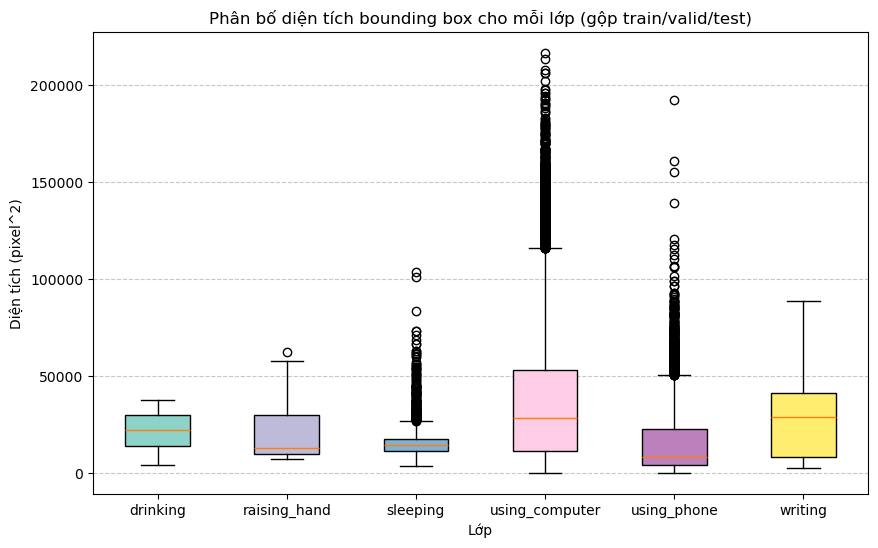


📈 BÁO CÁO CHI TIẾT

🔍 TRAIN

🏷️ Lớp: drinking
   - Số lượng: 42
   - Chiều rộng (px):
     Min: 98.3 | Max: 175.0
     Trung bình: 131.6 | Median: 131.0
   - Chiều cao (px):
     Min: 105.4 | Max: 227.0
     Trung bình: 169.0 | Median: 182.5
   - Diện tích (px²):
     Min: 11142.5 | Max: 37800.0
     Trung bình: 22779.5
   - Label không hợp lệ: 702

🏷️ Lớp: raising_hand
   - Số lượng: 12
   - Chiều rộng (px):
     Min: 79.2 | Max: 202.0
     Trung bình: 134.8 | Median: 130.0
   - Chiều cao (px):
     Min: 108.7 | Max: 309.0
     Trung bình: 176.5 | Median: 143.5
   - Diện tích (px²):
     Min: 8611.1 | Max: 62418.0
     Trung bình: 27038.6
   - Label không hợp lệ: 0

🏷️ Lớp: sleeping
   - Số lượng: 1742
   - Chiều rộng (px):
     Min: 46.3 | Max: 609.0
     Trung bình: 138.5 | Median: 135.0
   - Chiều cao (px):
     Min: 40.0 | Max: 314.0
     Trung bình: 114.1 | Median: 106.3
   - Diện tích (px²):
     Min: 3457.8 | Max: 103620.0
     Trung bình: 16436.7
   - Label không hợp lệ: 0

🏷

In [15]:
import os
import yaml
import cv2
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import random
from collections import defaultdict

def analyze_dataset(yaml_path):
    """Phân tích dataset YOLO với các tính năng:
    - Kiểm tra label hợp lệ
    - Thống kê kích thước bounding box
    - Phát hiện bất thường
    - Trực quan hóa dữ liệu
    """
    
    # 1. Đọc file cấu hình YAML
    with open(yaml_path, 'r') as f:
        data = yaml.safe_load(f)
    root_dir = os.path.dirname(yaml_path)
    class_names = data['names']
    print(f"✅ Đã đọc cấu hình từ {yaml_path}")
    print(f"📦 Số lớp: {len(class_names)} - Tên lớp: {class_names}")

    # 2. Khởi tạo cấu trúc lưu trữ thống kê
    stats = {
        split: {
            cls: {
                'count': 0,
                'widths': [],
                'heights': [],
                'areas': [],
                'examples': [],
                'invalid': 0
            } for cls in class_names
        } for split in ['train', 'valid', 'test']
    }

    # 3. Duyệt qua các tập dữ liệu
    for split in ['train', 'valid', 'test']:
        img_dir = os.path.join(root_dir, split, 'images')
        label_dir = os.path.join(root_dir, split, 'labels')

        if not os.path.exists(img_dir):
            print(f"⛔ Thiếu thư mục ảnh {split}")
            continue

        # 4. Xử lý từng ảnh
        for img_file in os.listdir(img_dir):
            if not img_file.lower().endswith(('.png', '.jpg', '.jpeg')):
                continue

            img_path = os.path.join(img_dir, img_file)
            label_path = os.path.join(label_dir, os.path.splitext(img_file)[0] + '.txt')

            if not os.path.exists(label_path):
                continue

            try:
                # 5. Đọc kích thước ảnh
                img = cv2.imread(img_path)
                if img is None:
                    print(f"❌ Không đọc được ảnh: {img_path}")
                    continue
                img_h, img_w = img.shape[:2]

                # 6. Xử lý từng label
                with open(label_path, 'r') as f:
                    for line in f:
                        line = line.strip()
                        if not line:
                            continue

                        parts = line.split()
                        # 7. Validate định dạng label
                        if len(parts) != 5:
                            stats[split][class_names[0]]['invalid'] += 1  # Giả định lớp đầu tiên cho lỗi
                            continue

                        try:
                            # 8. Chuyển đổi và kiểm tra tọa độ
                            class_id, xc, yc, w, h = map(float, parts)
                            if not (0 <= xc <= 1 and 0 <= yc <= 1 and 0 <= w <= 1 and 0 <= h <= 1):
                                stats[split][class_names[int(class_id)]]['invalid'] += 1
                                continue

                            # 9. Tính toán kích thước thực tế
                            box_w = w * img_w
                            box_h = h * img_h
                            area = box_w * box_h

                            # 10. Cập nhật thống kê
                            cls_name = class_names[int(class_id)]
                            stats[split][cls_name]['count'] += 1
                            stats[split][cls_name]['widths'].append(box_w)
                            stats[split][cls_name]['heights'].append(box_h)
                            stats[split][cls_name]['areas'].append(area)
                            stats[split][cls_name]['examples'].append(img_path)

                        except (ValueError, IndexError) as e:
                            print(f"Lỗi xử lý label: {str(e)}")
                            continue

            except Exception as e:
                print(f"Lỗi xử lý ảnh {img_path}: {str(e)}")

    # 11. Phân tích và hiển thị kết quả
    # _visualize_distributions(stats, class_names)
    visualize_single_plot(stats, class_names)
    
    _generate_report(stats, class_names)

import matplotlib.pyplot as plt
import numpy as np
def visualize_single_plot(stats, classes):
    """
    Vẽ boxplot trên một biểu đồ duy nhất để xem phân bố diện tích bounding box
    của mỗi lớp (tổng hợp cả train/valid/test). Qua đó dễ thấy các outlier.
    """
    all_data = []
    x_labels = []
    
    # Gộp toàn bộ diện tích (area) của mỗi lớp từ train, valid, test
    for cls in classes:
        areas = []
        for split in ['train', 'valid', 'test']:
            areas.extend(stats[split][cls]['areas'])
        
        # Nếu lớp này có bounding box
        if len(areas) > 0:
            all_data.append(areas)
            x_labels.append(cls)

    # Tạo figure
    plt.figure(figsize=(10, 6))
    
    # Vẽ boxplot (showfliers=True để hiển thị outlier)
    bplot = plt.boxplot(all_data, labels=x_labels, showfliers=True, patch_artist=True)
    
    # Tô màu cho từng box để dễ phân biệt
    colors = plt.cm.Set3(np.linspace(0, 1, len(all_data)))
    for patch, color in zip(bplot['boxes'], colors):
        patch.set_facecolor(color)

    # Thêm tiêu đề, trục
    plt.title("Phân bố diện tích bounding box cho mỗi lớp (gộp train/valid/test)")
    plt.xlabel("Lớp")
    plt.ylabel("Diện tích (pixel^2)")
    plt.grid(True, axis='y', linestyle='--', alpha=0.7)
    plt.show()
def _visualize_distributions(stats, classes):
    """Trực quan hóa phân bố kích thước bounding box"""
    n_classes = len(classes)
    n_cols = 2  # Số cột tùy chọn
    n_rows = (n_classes + n_cols - 1) // n_cols  # Tính số hàng cần thiết
    
    plt.figure(figsize=(14, 5*n_rows))  # Điều chỉnh kích thước theo số hàng
    
    # Vẽ biểu đồ cho từng lớp
    for idx, cls in enumerate(classes, 1):
        plt.subplot(n_rows, n_cols, idx)  # Sửa thành grid động
        
        all_widths = []
        all_heights = []
        for split in ['train', 'valid', 'test']:
            all_widths.extend(stats[split][cls]['widths'])
            all_heights.extend(stats[split][cls]['heights'])
        
        if all_widths:
            sns.histplot(x=all_widths, kde=True, color='blue', label='Width')
            sns.histplot(x=all_heights, kde=True, color='red', label='Height')
            plt.title(f'Phân bố kích thước - {cls}')
            plt.xlabel('Pixel')
            plt.legend()
    
    plt.tight_layout()
    plt.show()
    
    # Biểu đồ boxplot
    plt.figure(figsize=(12, 6))
    data = []
    labels = []
    for cls in classes:
        for split in ['train', 'valid', 'test']:
            if stats[split][cls]['areas']:
                data.append(stats[split][cls]['areas'])
                labels.append(f"{cls}_{split}")
    
    plt.boxplot(data, vert=False, patch_artist=True)
    plt.yticks(np.arange(1, len(labels)+1), labels)
    plt.title('Phân bố diện tích bounding box')
    plt.xlabel('Diện tích (pixel²)')
    plt.show()

def _generate_report(stats, classes):
    """Tạo báo cáo chi tiết"""
    print("\n📈 BÁO CÁO CHI TIẾT")
    
    for split in ['train', 'valid', 'test']:
        print(f"\n🔍 {split.upper()}")
        total = 0
        
        for cls in classes:
            cls_stats = stats[split][cls]
            if cls_stats['count'] == 0:
                continue
                
            # Tính các chỉ số thống kê
            widths = cls_stats['widths']
            heights = cls_stats['heights']
            areas = cls_stats['areas']
            
            report = {
                'count': cls_stats['count'],
                'width': {
                    'min': np.min(widths),
                    'max': np.max(widths),
                    'mean': np.mean(widths),
                    'median': np.median(widths)
                },
                'height': {
                    'min': np.min(heights),
                    'max': np.max(heights),
                    'mean': np.mean(heights),
                    'median': np.median(heights)
                },
                'area': {
                    'min': np.min(areas),
                    'max': np.max(areas),
                    'mean': np.mean(areas)
                },
                'invalid': cls_stats['invalid']
            }

            # In báo cáo
            print(f"\n🏷️ Lớp: {cls}")
            print(f"   - Số lượng: {report['count']}")
            print(f"   - Chiều rộng (px):")
            print(f"     Min: {report['width']['min']:.1f} | Max: {report['width']['max']:.1f}")
            print(f"     Trung bình: {report['width']['mean']:.1f} | Median: {report['width']['median']:.1f}")
            print(f"   - Chiều cao (px):")
            print(f"     Min: {report['height']['min']:.1f} | Max: {report['height']['max']:.1f}")
            print(f"     Trung bình: {report['height']['mean']:.1f} | Median: {report['height']['median']:.1f}")
            print(f"   - Diện tích (px²):")
            print(f"     Min: {report['area']['min']:.1f} | Max: {report['area']['max']:.1f}")
            print(f"     Trung bình: {report['area']['mean']:.1f}")
            print(f"   - Label không hợp lệ: {report['invalid']}")

            total += report['count']
        
        print(f"\nTổng số objects: {total}")

# Chạy chương trình
if __name__ == "__main__":
    analyze_dataset(f'/home/minhnv/Documents/ntt/AiIot/FinalPorject/CodingYOLOv12/Dataset/Student-Behavior-Recognition-5/data.yaml')

### 2.3 Export label wrong out folder ( StaticModels/yolov12s09032025_ver-dataset2/_ver1/invalid )

✅ Đã export 325 ảnh lỗi vào: /home/minhnv/Documents/ntt/AiIot/FinalPorject/CodingYOLOv12/StaticModels/yolov12s11032025_230655_ver-dataset5/_ver1/invalid_label
✅ Báo cáo chi tiết: /home/minhnv/Documents/ntt/AiIot/FinalPorject/CodingYOLOv12/StaticModels/yolov12s11032025_230655_ver-dataset5/_ver1/invalid_report.txt


/tmp/ipykernel_3395547/3772872582.py:147: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=reasons, y=counts, palette="viridis")


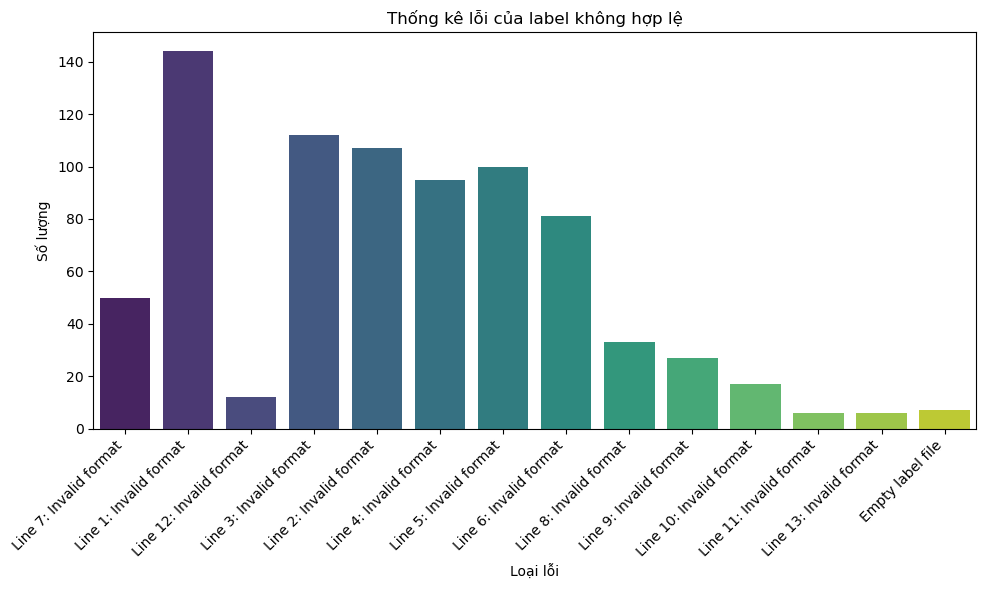

Đã xóa ảnh: /home/minhnv/Documents/ntt/AiIot/FinalPorject/CodingYOLOv12/Dataset/Student-Behavior-Recognition-5/train/images/13_25_00-13_30_00-M-0-0-0-_frame_0284_png.rf.86ff7962261b9db2ca5bb1d195d38d5b.jpg
Đã xóa ảnh: /home/minhnv/Documents/ntt/AiIot/FinalPorject/CodingYOLOv12/Dataset/Student-Behavior-Recognition-5/train/images/13_30_00-13_35_00-M-0-0-0-_frame_0046_png.rf.7690105109dde90054796d6ce5578f4c.jpg
Đã xóa ảnh: /home/minhnv/Documents/ntt/AiIot/FinalPorject/CodingYOLOv12/Dataset/Student-Behavior-Recognition-5/train/images/13_25_00-13_30_00-M-0-0-0-_frame_0151_png.rf.c288e98b9ea2cac1e334e917c724f9bd.jpg
Đã xóa ảnh: /home/minhnv/Documents/ntt/AiIot/FinalPorject/CodingYOLOv12/Dataset/Student-Behavior-Recognition-5/train/images/13_21_39-13_25_00-M-0-0-0-_frame_0141_png.rf.57ee0749a55782532b84885c8b242d10.jpg
Đã xóa ảnh: /home/minhnv/Documents/ntt/AiIot/FinalPorject/CodingYOLOv12/Dataset/Student-Behavior-Recognition-5/train/images/13_25_00-13_30_00-M-0-0-0-_frame_0154_png.rf.a95d2ba

In [8]:
import os
import shutil
import yaml
from collections import defaultdict
import matplotlib.pyplot as plt
import seaborn as sns

def export_invalid_labels(yaml_path, output_dir):
    """
    Export các ảnh và label không hợp lệ vào thư mục riêng và tạo báo cáo chi tiết.
    
    Ý tưởng:
    1. Đọc cấu hình dataset từ file YAML để lấy danh sách các lớp.
    2. Tạo các thư mục output cho ảnh và label hợp lệ (clean) và không hợp lệ (invalid).
    3. Duyệt qua các tập dữ liệu (train, valid, test), kiểm tra từng file label.
       - Nếu file label không tồn tại hoặc nội dung không hợp lệ (sai định dạng, lỗi chuyển đổi, 
         tọa độ hoặc class ID không hợp lệ), ghi lại lỗi.
    4. Nếu một ảnh có label không hợp lệ, copy ảnh và file label (nếu tồn tại) sang thư mục invalid.
    5. Ghi báo cáo chi tiết các lỗi vào file text.
    6. Trả về report chứa thông tin thống kê để có thể dùng cho việc trực quan hóa sau này.
    """
    # 1. Đọc cấu hình dataset từ file YAML
    with open(yaml_path, 'r') as f:
        data = yaml.safe_load(f)
    root_dir = os.path.dirname(yaml_path)
    class_names = data['names']
    
    # 2. Tạo thư mục output cho label không hợp lệ (invalid_label)
    invalid_dir = os.path.join(output_dir, 'invalid_label')
    os.makedirs(os.path.join(invalid_dir, 'images'), exist_ok=True)
    os.makedirs(os.path.join(invalid_dir, 'labels'), exist_ok=True)
    
    # Khởi tạo report thống kê
    report = {
        'total_images': 0,      # Tổng số ảnh được kiểm tra
        'invalid_images': 0,    # Số ảnh có label không hợp lệ
        'details': []           # Chi tiết lỗi của từng ảnh: { 'image': ..., 'reasons': [list of errors] }
    }
    
    # 3. Duyệt qua các tập dữ liệu: train, valid, test
    for split in ['train', 'valid', 'test']:
        img_dir = os.path.join(root_dir, split, 'images')
        label_dir = os.path.join(root_dir, split, 'labels')
        
        if not os.path.exists(img_dir):
            continue
            
        # 4. Xử lý từng ảnh trong tập dữ liệu
        for img_file in os.listdir(img_dir):
            report['total_images'] += 1  # Cập nhật tổng số ảnh
            img_path = os.path.join(img_dir, img_file)
            label_path = os.path.join(label_dir, os.path.splitext(img_file)[0] + '.txt')
            
            invalid_reasons = []  # Danh sách lỗi cho ảnh hiện tại
            
            # 5. Kiểm tra file label
            if not os.path.exists(label_path):
                invalid_reasons.append('Missing label file')
            else:
                with open(label_path, 'r') as f:
                    lines = f.readlines()
                    # Nếu file label trống
                    if not lines:
                        invalid_reasons.append('Empty label file')
                    
                    # Duyệt từng dòng label
                    for line_idx, line in enumerate(lines, 1):
                        line = line.strip()
                        parts = line.split()
                        
                        # Kiểm tra định dạng: phải có đúng 5 giá trị
                        if len(parts) != 5:
                            invalid_reasons.append(f'Line {line_idx}: Invalid format')
                            continue
                            
                        try:
                            # Chuyển đổi các giá trị sang float
                            class_id, xc, yc, w, h = map(float, parts)
                            # Kiểm tra tọa độ và kích thước phải nằm trong khoảng [0, 1]
                            if not (0 <= xc <= 1 and 0 <= yc <= 1 and 0 <= w <= 1 and 0 <= h <= 1):
                                invalid_reasons.append(f'Line {line_idx}: Invalid coordinates')
                            
                            # Kiểm tra class ID hợp lệ (không vượt quá số lượng lớp)
                            if int(class_id) >= len(class_names):
                                invalid_reasons.append(f'Line {line_idx}: Invalid class ID {class_id}')
                                
                        except ValueError:
                            invalid_reasons.append(f'Line {line_idx}: Conversion error')
            
            # 6. Nếu có lỗi, copy ảnh và file label vào thư mục invalid và cập nhật báo cáo
            if invalid_reasons:
                report['invalid_images'] += 1  # Tăng số lượng ảnh lỗi
                # Copy ảnh sang thư mục invalid
                shutil.copy(img_path, os.path.join(invalid_dir, 'images', img_file))
                # Copy file label (nếu tồn tại)
                if os.path.exists(label_path):
                    shutil.copy(label_path, os.path.join(invalid_dir, 'labels', os.path.basename(label_path)))
                
                # Lưu chi tiết lỗi vào báo cáo
                report['details'].append({
                    'image': img_path,
                    'reasons': invalid_reasons
                })
    
    # 7. Ghi báo cáo chi tiết vào file text
    report_file = os.path.join(output_dir, 'invalid_report.txt')
    with open(report_file, 'w') as f:
        f.write(f"Tổng số ảnh đã kiểm tra: {report['total_images']}\n")
        f.write(f"Số ảnh có label không hợp lệ: {report['invalid_images']}\n\n")
        f.write("Chi tiết các lỗi:\n")
        for entry in report['details']:
            f.write(f"\nẢnh: {entry['image']}\n")
            for reason in entry['reasons']:
                f.write(f" - {reason}\n")
    
    print(f"✅ Đã export {report['invalid_images']} ảnh lỗi vào: {invalid_dir}")
    print(f"✅ Báo cáo chi tiết: {report_file}")
    
    # Trả về report để có thể dùng cho trực quan hóa sau này
    return report

def visualize_invalid_labels(report):
    """
    Trực quan hóa thống kê các lỗi của label không hợp lệ.
    
    Ý tưởng:
    1. Lặp qua các entry trong report['details'] để tính số lần xuất hiện của từng lỗi.
    2. Tạo danh sách các lỗi và số lượng tương ứng.
    3. Vẽ biểu đồ cột bằng seaborn để hiển thị thống kê lỗi.
    
    Đầu vào:
        report: Dictionary báo cáo được trả về từ hàm export_invalid_labels.
    """
    error_counts = defaultdict(int)  # Dictionary để lưu số lần xuất hiện của mỗi lỗi
    
    # Lặp qua từng ảnh trong report
    for entry in report['details']:
        for reason in entry['reasons']:
            error_counts[reason] += 1  # Tăng số đếm cho lỗi này
    
    # Chuyển dictionary error_counts thành danh sách để trực quan hóa
    reasons = list(error_counts.keys())
    counts = list(error_counts.values())
    
    # Vẽ biểu đồ cột sử dụng seaborn
    plt.figure(figsize=(10, 6))
    sns.barplot(x=reasons, y=counts, palette="viridis")
    plt.title("Thống kê lỗi của label không hợp lệ")
    plt.xlabel("Loại lỗi")
    plt.ylabel("Số lượng")
    plt.xticks(rotation=45, ha="right")
    plt.tight_layout()
    plt.show()
def delete_invalid_images(report):
    """
    Xóa các bức ảnh bị invalid_label khỏi thư mục gốc dựa trên báo cáo.
    
    Ý tưởng:
      - Lặp qua danh sách các ảnh có lỗi trong report['details'].
      - Xác định folder của ảnh đó (train, valid, hoặc test) dựa trên đường dẫn.
      - Nếu file ảnh tồn tại, xóa file và tăng bộ đếm theo folder.
      - Sau cùng, in ra tổng số ảnh đã xóa theo từng folder.
    """
    # Khởi tạo bộ đếm cho từng split
    deleted_counts = {"train": 0, "valid": 0, "test": 0}
    
    # Duyệt qua từng entry trong report
    for entry in report['details']:
        image_path = entry['image']
        try:
            if os.path.exists(image_path):
                os.remove(image_path)
                print(f"Đã xóa ảnh: {image_path}")
                # Phân tích đường dẫn để xác định folder (train, valid, test)
                path_parts = os.path.normpath(image_path).split(os.sep)
                # Tìm phần chứa "train", "valid" hoặc "test"
                for split in ["train", "valid", "test"]:
                    if split in path_parts:
                        deleted_counts[split] += 1
                        break
            else:
                print(f"Ảnh không tồn tại: {image_path}")
        except Exception as e:
            print(f"Lỗi khi xóa ảnh {image_path}: {e}")
    
    # In ra báo cáo thống kê số ảnh đã xóa theo folder
    print("\n=== Báo cáo xóa ảnh invalid ===")
    for split in ["train", "valid", "test"]:
        print(f"{split.capitalize()}: Đã xóa {deleted_counts[split]} ảnh")

# Sử dụng
output_directory = unique_save_path
# Gọi hàm export_invalid_labels để xuất các ảnh và label không hợp lệ, đồng thời tạo báo cáo chi tiết
report = export_invalid_labels(data_yaml_path, output_directory)

# Trực quan hóa thống kê lỗi dựa trên báo cáo thu được
visualize_invalid_labels(report)

# Xóa các ảnh bị invalid_label trong thư mục gốc
delete_invalid_images(report)


### 2.4 Vẽ bouding box ( Từ những file đã export ở trên )

In [13]:
import os
import shutil
import yaml
from collections import defaultdict
import matplotlib.pyplot as plt
import seaborn as sns

def export_invalid_labels(yaml_path, output_dir):
    """
    Export các ảnh và label không hợp lệ vào thư mục riêng và tạo báo cáo chi tiết.
    
    Ý tưởng:
    1. Đọc cấu hình dataset từ file YAML để lấy danh sách các lớp.
    2. Tạo các thư mục output cho ảnh và label hợp lệ (clean) và không hợp lệ (invalid).
    3. Duyệt qua các tập dữ liệu (train, valid, test), kiểm tra từng file label.
       - Nếu file label không tồn tại hoặc nội dung không hợp lệ (sai định dạng, lỗi chuyển đổi, 
         tọa độ hoặc class ID không hợp lệ), ghi lại lỗi.
    4. Nếu một ảnh có label không hợp lệ, copy ảnh và file label (nếu tồn tại) sang thư mục invalid.
    5. Ghi báo cáo chi tiết các lỗi vào file text.
    6. Trả về report chứa thông tin thống kê để có thể dùng cho việc trực quan hóa sau này.
    """
    # 1. Đọc cấu hình dataset từ file YAML
    with open(yaml_path, 'r') as f:
        data = yaml.safe_load(f)
    root_dir = os.path.dirname(yaml_path)
    class_names = data['names']
    
    # 2. Tạo thư mục output cho label không hợp lệ (invalid_label)
    invalid_dir = os.path.join(output_dir, 'invalid_label')
    os.makedirs(os.path.join(invalid_dir, 'images'), exist_ok=True)
    os.makedirs(os.path.join(invalid_dir, 'labels'), exist_ok=True)
    
    # Khởi tạo report thống kê
    report = {
        'total_images': 0,      # Tổng số ảnh được kiểm tra
        'invalid_images': 0,    # Số ảnh có label không hợp lệ
        'details': []           # Chi tiết lỗi của từng ảnh: { 'image': ..., 'reasons': [list of errors] }
    }
    
    # 3. Duyệt qua các tập dữ liệu: train, valid, test
    for split in ['train', 'valid', 'test']:
        img_dir = os.path.join(root_dir, split, 'images')
        label_dir = os.path.join(root_dir, split, 'labels')
        
        if not os.path.exists(img_dir):
            continue
            
        # 4. Xử lý từng ảnh trong tập dữ liệu
        for img_file in os.listdir(img_dir):
            report['total_images'] += 1  # Cập nhật tổng số ảnh
            img_path = os.path.join(img_dir, img_file)
            label_path = os.path.join(label_dir, os.path.splitext(img_file)[0] + '.txt')
            
            invalid_reasons = []  # Danh sách lỗi cho ảnh hiện tại
            
            # 5. Kiểm tra file label
            if not os.path.exists(label_path):
                invalid_reasons.append('Missing label file')
            else:
                with open(label_path, 'r') as f:
                    lines = f.readlines()
                    # Nếu file label trống
                    if not lines:
                        invalid_reasons.append('Empty label file')
                    
                    # Duyệt từng dòng label
                    for line_idx, line in enumerate(lines, 1):
                        line = line.strip()
                        parts = line.split()
                        
                        # Kiểm tra định dạng: phải có đúng 5 giá trị
                        if len(parts) != 5:
                            invalid_reasons.append(f'Line {line_idx}: Invalid format')
                            continue
                            
                        try:
                            # Chuyển đổi các giá trị sang float
                            class_id, xc, yc, w, h = map(float, parts)
                            # Kiểm tra tọa độ và kích thước phải nằm trong khoảng [0, 1]
                            if not (0 <= xc <= 1 and 0 <= yc <= 1 and 0 <= w <= 1 and 0 <= h <= 1):
                                invalid_reasons.append(f'Line {line_idx}: Invalid coordinates')
                            
                            # Kiểm tra class ID hợp lệ (không vượt quá số lượng lớp)
                            if int(class_id) >= len(class_names):
                                invalid_reasons.append(f'Line {line_idx}: Invalid class ID {class_id}')
                                
                        except ValueError:
                            invalid_reasons.append(f'Line {line_idx}: Conversion error')
            
            # 6. Nếu có lỗi, copy ảnh và file label vào thư mục invalid và cập nhật báo cáo
            if invalid_reasons:
                report['invalid_images'] += 1  # Tăng số lượng ảnh lỗi
                # Copy ảnh sang thư mục invalid
                shutil.copy(img_path, os.path.join(invalid_dir, 'images', img_file))
                # Copy file label (nếu tồn tại)
                if os.path.exists(label_path):
                    shutil.copy(label_path, os.path.join(invalid_dir, 'labels', os.path.basename(label_path)))
                
                # Lưu chi tiết lỗi vào báo cáo
                report['details'].append({
                    'image': img_path,
                    'reasons': invalid_reasons
                })
    
    # 7. Ghi báo cáo chi tiết vào file text
    report_file = os.path.join(output_dir, 'invalid_report.txt')
    with open(report_file, 'w') as f:
        f.write(f"Tổng số ảnh đã kiểm tra: {report['total_images']}\n")
        f.write(f"Số ảnh có label không hợp lệ: {report['invalid_images']}\n\n")
        f.write("Chi tiết các lỗi:\n")
        for entry in report['details']:
            f.write(f"\nẢnh: {entry['image']}\n")
            for reason in entry['reasons']:
                f.write(f" - {reason}\n")
    
    print(f"✅ Đã export {report['invalid_images']} ảnh lỗi vào: {invalid_dir}")
    print(f"✅ Báo cáo chi tiết: {report_file}")
    
    # Trả về report để có thể dùng cho trực quan hóa sau này
    return report

def visualize_invalid_labels(report):
    """
    Trực quan hóa thống kê các lỗi của label không hợp lệ.
    
    Ý tưởng:
    1. Lặp qua các entry trong report['details'] để tính số lần xuất hiện của từng lỗi.
    2. Tạo danh sách các lỗi và số lượng tương ứng.
    3. Vẽ biểu đồ cột bằng seaborn để hiển thị thống kê lỗi.
    
    Đầu vào:
        report: Dictionary báo cáo được trả về từ hàm export_invalid_labels.
    """
    error_counts = defaultdict(int)  # Dictionary để lưu số lần xuất hiện của mỗi lỗi
    
    # Lặp qua từng ảnh trong report
    for entry in report['details']:
        for reason in entry['reasons']:
            error_counts[reason] += 1  # Tăng số đếm cho lỗi này
    
    # Chuyển dictionary error_counts thành danh sách để trực quan hóa
    reasons = list(error_counts.keys())
    counts = list(error_counts.values())
    
    # Vẽ biểu đồ cột sử dụng seaborn
    plt.figure(figsize=(10, 6))
    sns.barplot(x=reasons, y=counts, palette="viridis")
    plt.title("Thống kê lỗi của label không hợp lệ")
    plt.xlabel("Loại lỗi")
    plt.ylabel("Số lượng")
    plt.xticks(rotation=45, ha="right")
    plt.tight_layout()
    plt.show()

if __name__ == "__main__":
    # Cập nhật đường dẫn tới folder chứa ảnh, folder chứa label và folder export
    image_folder = f"{unique_save_path}/invalid_label/images"
    label_folder = f"{unique_save_path}/invalid_label/labels"
    output_folder = f"{unique_save_path}/invalid_label/visualize_images"
    
    # Gọi hàm export_invalid_labels để xuất các ảnh và label không hợp lệ, đồng thời tạo báo cáo chi tiết
    report = export_invalid_labels(data_yaml_path, output_directory)
    # Trực quan hóa thống kê lỗi dựa trên báo cáo thu được
    visualize_invalid_labels(report)

Đang xử lý ảnh: /home/minhnv/Documents/ntt/AiIot/FinalPorject/CodingYOLOv12/StaticModels/yolov12s11032025_185420_ver-dataset5/_ver1/invalid_label/images/13_25_00-13_30_00-M-0-0-0-_frame_0284_png.rf.86ff7962261b9db2ca5bb1d195d38d5b.jpg
Định dạng không hợp lệ label_id:/home/minhnv/Documents/ntt/AiIot/FinalPorject/CodingYOLOv12/StaticModels/yolov12s11032025_185420_ver-dataset5/_ver1/invalid_label/labels/13_25_00-13_30_00-M-0-0-0-_frame_0284_png.rf.86ff7962261b9db2ca5bb1d195d38d5b.txt, giá trị:  3 0.860560646875 0.4961457083333333 0.8545920598958333 0.4576036527777778 0.8513053723958334 0.4494692824074074 0.8430498223958334 0.45368775925925925 0.8406290104166667 0.46310295 0.8370399286458333 0.46610523611111115 0.8376513286458334 0.47069973055555553 0.8335417307291666 0.4737343314814815 0.8332393364583334 0.48487098796296296 0.8282704744791667 0.49722383611111115 0.8317571072916666 0.5155371870370371 0.8319388755208333 0.5247908064814816 0.8294998869791667 0.5332806351851852 0.813170555729

### 2.6 Làm sạch dữ liệu ( Loại bỏ các label dư thừa giá trị ) ver 2

In [50]:
import os
import yaml
import cv2
import numpy as np
import shutil
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from sklearn.model_selection import train_test_split
from collections import defaultdict
from imgaug import augmenters as iaa

# ========================== CẤU HÌNH ==========================
MIN_AREA = 10      # Diện tích tối thiểu của bounding box (pixel²)
MIN_DIM = 1        # Kích thước tối thiểu của bounding box (chiều rộng hoặc chiều cao)
AUGMENT_CLASSES = [ # Danh sách các lớp cần tăng cường dữ liệu qua augmentation
    "drinking", 
    "raising_hand",
    "sleeping",
    "writing"
]
# ===============================================================

def analyze_and_improve_dataset(yaml_path, output_dir):
    """
    Pipeline xử lý dataset:
      1. Đọc cấu hình dataset từ file YAML.
      2. Tạo thư mục đầu ra cho các tập: train, valid, test và cho dữ liệu invalid.
      3. Duyệt qua các tập dữ liệu gốc và xử lý từng ảnh:
         - Đọc ảnh và label.
         - Lọc và chuẩn hóa label, cập nhật thống kê.
      4. Lưu ảnh và file label hợp lệ vào thư mục output theo cấu trúc.
      5. Lưu dữ liệu không hợp lệ vào thư mục invalid.
      6. Cân bằng dữ liệu qua augmentation cho các lớp có số mẫu thấp (cho tất cả các tập).
      
    Đầu vào:
      - yaml_path: đường dẫn file YAML.
      - output_dir: thư mục đầu ra đã xử lý.
      
    Trả về:
      - stats: thống kê kết quả xử lý cho từng tập.
    """
    with open(yaml_path, 'r') as f:
        data = yaml.safe_load(f)
    root_dir = os.path.dirname(yaml_path)
    class_names = data['names']

    # Tạo thư mục output cho mỗi split và invalid
    for split in ['train', 'valid', 'test']:
        os.makedirs(os.path.join(output_dir, split, 'images'), exist_ok=True)
        os.makedirs(os.path.join(output_dir, split, 'labels'), exist_ok=True)
    for split in ['train', 'valid', 'test']:
        os.makedirs(os.path.join(output_dir, 'invalid', split, 'images'), exist_ok=True)
        os.makedirs(os.path.join(output_dir, 'invalid', split, 'labels'), exist_ok=True)

    all_files = []  # Lưu tuple (split, class distribution) cho mỗi ảnh
    stats = defaultdict(lambda: defaultdict(int))

    # Xử lý dữ liệu ở từng split gốc
    for split in ['train', 'valid', 'test']:
        img_dir = os.path.join(root_dir, split, 'images')
        label_dir = os.path.join(root_dir, split, 'labels')
        if not os.path.exists(img_dir):
            continue
        for img_file in os.listdir(img_dir):
            if not img_file.lower().endswith(('.png', '.jpg', '.jpeg')):
                continue
            img_path = os.path.join(img_dir, img_file)
            label_path = os.path.join(label_dir, os.path.splitext(img_file)[0] + '.txt')
            valid_labels, invalid_labels, class_dist = process_labels(
                label_path, img_path, class_names, stats[split]
            )
            if valid_labels:
                save_clean_data(img_path, valid_labels, os.path.join(output_dir, split), img_file)
                all_files.append((split, class_dist))
            if invalid_labels:
                save_invalid_data(img_path, invalid_labels, os.path.join(output_dir, 'invalid', split), img_file)
                    
    # Cân bằng dữ liệu bằng augmentation cho các lớp có số mẫu thấp trên tất cả các split
    balance_dataset(output_dir, class_names, all_files, splits=["train", "valid", "test"])
    
    return stats

def process_labels(label_path, img_path, class_names, stats):
    valid_labels = []
    invalid_labels = []
    class_dist = defaultdict(int)
    try:
        img = cv2.imread(img_path)
        if img is None:
            return [], [], {}
        h, w = img.shape[:2]
        with open(label_path, 'r') as f:
            for line in f:
                line = line.strip()
                if not line:
                    continue
                parts = line.split()
                if len(parts) != 5:
                    stats['invalid'] += 1
                    invalid_labels.append(line)
                    continue
                try:
                    class_id, xc, yc, bw, bh = map(float, parts)
                    if not (0 <= xc <= 1 and 0 <= yc <= 1 and 0 <= bw <= 1 and 0 <= bh <= 1):
                        stats['invalid'] += 1
                        invalid_labels.append(line)
                        continue
                    box_w = bw * w
                    box_h = bh * h
                    area = box_w * box_h
                    if area < MIN_AREA or box_w < MIN_DIM or box_h < MIN_DIM:
                        stats['invalid'] += 1
                        invalid_labels.append(line)
                        continue
                    cls_name = class_names[int(class_id)]
                    stats[cls_name] += 1
                    class_dist[cls_name] += 1
                    valid_labels.append(line)
                except Exception as e:
                    stats['invalid'] += 1
                    invalid_labels.append(line)
    except Exception as e:
        print(f"Error processing {label_path}: {str(e)}")
    return valid_labels, invalid_labels, class_dist

def save_clean_data(img_path, labels, output_dir, img_file):
    shutil.copy(img_path, os.path.join(output_dir, 'images', img_file))
    label_file = os.path.splitext(img_file)[0] + '.txt'
    with open(os.path.join(output_dir, 'labels', label_file), 'w') as f:
        f.write('\n'.join(labels))

def save_invalid_data(img_path, invalid_labels, output_dir, img_file):
    os.makedirs(os.path.join(output_dir, 'images'), exist_ok=True)
    os.makedirs(os.path.join(output_dir, 'labels'), exist_ok=True)
    shutil.copy(img_path, os.path.join(output_dir, 'images', img_file))
    label_file = os.path.splitext(img_file)[0] + '.txt'
    with open(os.path.join(output_dir, 'labels', label_file), 'w') as f:
        f.write('\n'.join(invalid_labels))

def augment_class_exclusive(data_dir, cls, target_count, augmenter, class_names, splits=["train", "valid", "test"]):
    """
    Tăng cường dữ liệu cho lớp 'cls' trên các split được chỉ định,
    nhưng chỉ áp dụng cho những ảnh mà file label chứa duy nhất đối tượng 'cls'.
    """
    import random
    for split in splits:
        print(f"Augmenting class '{cls}' exclusively in {split} split to reach {target_count} samples.")
        split_images_dir = os.path.join(data_dir, split, "images")
        split_labels_dir = os.path.join(data_dir, split, "labels")
        if not os.path.exists(split_images_dir) or not os.path.exists(split_labels_dir):
            continue
        
        # Tìm các ảnh mà file label chỉ chứa đối tượng cls
        images_to_augment = []
        for label_file in os.listdir(split_labels_dir):
            label_path = os.path.join(split_labels_dir, label_file)
            with open(label_path, 'r') as f:
                lines = f.readlines()
            # Kiểm tra xem tất cả các dòng trong file label có thuộc lớp cls hay không
            all_cls_match = True
            for line in lines:
                parts = line.strip().split()
                if len(parts) < 1:
                    all_cls_match = False
                    break
                try:
                    class_id = int(float(parts[0]))
                    if class_names[class_id] != cls:
                        all_cls_match = False
                        break
                except:
                    all_cls_match = False
                    break
            if all_cls_match and lines:
                images_to_augment.append(label_file.replace(".txt", ""))
        
        if not images_to_augment:
            print(f"Không có ảnh nào có label duy nhất của lớp '{cls}' trong split {split}. Bỏ qua augmentation.")
            continue

        current_count = len(images_to_augment)
        augment_needed = target_count - current_count
        if augment_needed <= 0:
            print(f"Không cần tăng cường thêm cho lớp '{cls}' ở {split}.")
            continue
        
        print(f"Cần tăng cường {augment_needed} mẫu cho lớp '{cls}' ở {split}.")
        aug_index = 0
        while aug_index < augment_needed:
            img_name = random.choice(images_to_augment)
            img_path = os.path.join(split_images_dir, img_name + ".jpg")
            label_path = os.path.join(split_labels_dir, img_name + ".txt")
            image = cv2.imread(img_path)
            if image is None:
                continue
            image_aug = augmenter.augment_image(image)
            new_img_name = f"{img_name}_aug_{aug_index}.jpg"
            new_label_name = f"{img_name}_aug_{aug_index}.txt"
            cv2.imwrite(os.path.join(split_images_dir, new_img_name), image_aug)
            # Nếu chỉ chọn ảnh chứa duy nhất lớp mục tiêu, ta có thể copy file label gốc mà không cần thay đổi
            shutil.copy(label_path, os.path.join(split_labels_dir, new_label_name))
            aug_index += 1

def balance_dataset(data_dir, class_names, all_files, splits=["train", "valid", "test"]):
    """
    Cân bằng dữ liệu bằng augmentation cho các lớp có số mẫu thấp.
      - Tính tổng số mẫu của từng lớp từ all_files.
      - Nếu số mẫu của một lớp nhỏ hơn một nửa số mẫu của lớp có nhiều nhất, tiến hành augmentation cho lớp đó trên các split được chỉ định.
    """
    class_counts = defaultdict(int)
    for _, dist in all_files:
        for cls, count in dist.items():
            class_counts[cls] += count

    if not class_counts:
        print("Không có mẫu hợp lệ để cân bằng. Bỏ qua bước augmentation.")
        return

    max_count = max(class_counts.values())
    
    for cls in class_names:
        if class_counts[cls] < max_count // 2 and cls in AUGMENT_CLASSES:
            augment_class_exclusive(
                data_dir, 
                cls, 
                target_count=max_count // 2,
                augmenter=iaa.Sequential([
                    iaa.Fliplr(0.5),
                    iaa.Affine(rotate=(-15, 15), scale=(0.8, 1.2)),
                    iaa.GaussianBlur(sigma=(0, 1.0))
                ]),
                class_names=class_names,
                splits=splits
            )

def visualize_improvements(stats_before, stats_after):
    """
    Trực quan hóa kết quả cải thiện dữ liệu bằng biểu đồ so sánh số lượng mẫu của từng lớp 
    trước và sau khi cải thiện.
    """
    all_keys = set(stats_before.keys()).union(set(stats_after.keys()))
    data = []
    for key in all_keys:
        data.append({
            'class': key,
            'before': stats_before.get(key, 0),
            'after': stats_after.get(key, 0)
        })
    df = pd.DataFrame(data)
    df_melt = df.melt(id_vars='class', value_vars=['before', 'after'], 
                      var_name='stage', value_name='count')
    plt.figure(figsize=(10, 6))
    sns.barplot(data=df_melt, x='class', y='count', hue='stage')
    plt.title("So sánh số lượng mẫu trước và sau cải thiện")
    plt.xlabel("Lớp")
    plt.ylabel("Số lượng mẫu")
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

# ====================== CHẠY CHƯƠNG TRÌNH ======================
if __name__ == "__main__":
    # Đường dẫn file YAML của dataset
    data_yaml_path = "/home/minhnv/Documents/ntt/AiIot/FinalPorject/CodingYOLOv12/Dataset/Student-Behavior-Recognition-5/data.yaml"
    input_yaml = data_yaml_path
    
    # Thư mục đầu ra chứa dữ liệu đã cải thiện
    output_dir = "/home/minhnv/Documents/ntt/AiIot/FinalPorject/CodingYOLOv12/Dataset/Student-Behavior-Recognition-5/Imporved_data"
    
    print("🔄 Đang xử lý dữ liệu...")
    stats = analyze_and_improve_dataset(input_yaml, output_dir)
    
    print("✅ Hoàn thành! Kết quả:")
    print(f" - Đã xử lý {sum(stats['train'].values())} mẫu huấn luyện")
    print(f" - Loại bỏ {stats['train']['invalid']} label không hợp lệ")
    
    # Ví dụ trực quan hóa cải thiện (sử dụng dữ liệu mẫu minh họa)
    stats_before = {"drinking": 120, "raising_hand": 80, "invalid": 30}
    stats_after  = {"drinking": 150, "raising_hand": 100, "invalid": 10}
    visualize_improvements(stats_before, stats_after)


🔄 Đang xử lý dữ liệu...
Augmenting class 'drinking' exclusively in train split to reach 5643 samples.
Không có ảnh nào có label duy nhất của lớp 'drinking' trong split train. Bỏ qua augmentation.
Augmenting class 'drinking' exclusively in valid split to reach 5643 samples.
Không có ảnh nào có label duy nhất của lớp 'drinking' trong split valid. Bỏ qua augmentation.
Augmenting class 'drinking' exclusively in test split to reach 5643 samples.
Không có ảnh nào có label duy nhất của lớp 'drinking' trong split test. Bỏ qua augmentation.
Augmenting class 'raising_hand' exclusively in train split to reach 5643 samples.
Không có ảnh nào có label duy nhất của lớp 'raising_hand' trong split train. Bỏ qua augmentation.
Augmenting class 'raising_hand' exclusively in valid split to reach 5643 samples.
Không có ảnh nào có label duy nhất của lớp 'raising_hand' trong split valid. Bỏ qua augmentation.
Augmenting class 'raising_hand' exclusively in test split to reach 5643 samples.
Không có ảnh nào có l

OSError: [Errno 122] Disk quota exceeded

### 2.7 Thống kê ảnh sau khi tăng cường và loại bỏ

In [48]:
import os
from collections import defaultdict
import pandas as pd

def count_labels_in_split(split_dir, class_names):
    """
    Đếm số lượng label theo lớp trong thư mục split (train/valid/test).
    
    Args:
        split_dir (str): Đường dẫn đến thư mục chứa split, có cấu trúc: split_dir/labels chứa các file label.
        class_names (list): Danh sách tên lớp theo thứ tự chỉ số.
        
    Returns:
        dict: Dictionary với key là tên lớp và value là số lượng label tương ứng.
    """
    labels_dir = os.path.join(split_dir, "labels")
    counts = defaultdict(int)
    
    if not os.path.exists(labels_dir):
        print(f"Không tìm thấy thư mục labels tại: {labels_dir}")
        return counts

    for label_file in os.listdir(labels_dir):
        if label_file.lower().endswith(".txt"):
            label_path = os.path.join(labels_dir, label_file)
            try:
                with open(label_path, "r", encoding="utf-8") as f:
                    for line in f:
                        parts = line.strip().split()
                        if len(parts) < 1:
                            continue
                        try:
                            class_id = int(float(parts[0]))
                            if class_id < len(class_names):
                                counts[class_names[class_id]] += 1
                            else:
                                counts["unknown"] += 1
                        except Exception as e:
                            counts["invalid"] += 1
            except Exception as e:
                print(f"Lỗi đọc file {label_path}: {e}")
    return counts

def count_labels_in_dataset(base_dir, class_names):
    """
    Thống kê số lượng label cho từng split: train, valid, test.
    
    Args:
        base_dir (str): Đường dẫn đến thư mục gốc của dataset đã được xử lý.
        class_names (list): Danh sách tên lớp.
    
    Returns:
        dict: Dictionary chứa thống kê theo từng split.
    """
    splits = ['train', 'valid', 'test']
    dataset_stats = {}
    
    for split in splits:
        split_dir = os.path.join(base_dir, split)
        stats = count_labels_in_split(split_dir, class_names)
        dataset_stats[split] = stats
    
    return dataset_stats

def visualize_stats(dataset_stats):
    """
    Trực quan hóa thống kê số lượng label của các split bằng bảng (DataFrame).
    
    Args:
        dataset_stats (dict): Kết quả thống kê theo từng split.
    """
    # Chuyển dữ liệu thành DataFrame
    data = []
    for split, stats in dataset_stats.items():
        for cls, count in stats.items():
            data.append({
                "Split": split,
                "Class": cls,
                "Count": count
            })
    df = pd.DataFrame(data)
    print(df)
    # Bạn có thể dùng seaborn hoặc matplotlib để vẽ biểu đồ, ví dụ:
    try:
        import seaborn as sns
        import matplotlib.pyplot as plt
        plt.figure(figsize=(8, 6))
        sns.barplot(data=df, x="Class", y="Count", hue="Split")
        plt.title("Thống kê label theo từng split")
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()
    except Exception as e:
        print("Không thể vẽ biểu đồ:", e)

# ------------------ Chạy ví dụ ------------------
if __name__ == "__main__":
    # Đường dẫn đến thư mục gốc của dataset (đã được xử lý, có các folder train, valid, test)
    base_dir = "/home/minhnv/Documents/ntt/AiIot/FinalPorject/CodingYOLOv12/Dataset/Student-Behavior-Recognition-5"
    
    # Danh sách tên lớp (ví dụ: từ file YAML)
    class_names = ['drinking', 'raising_hand', 'sleeping', 'using_computer', 'using_phone', 'writing']
    
    # Thống kê label cho từng split
    dataset_stats = count_labels_in_dataset(base_dir, class_names)
    
    # In kết quả thống kê
    for split, stats in dataset_stats.items():
        print(f"\nSplit: {split}")
        for cls, count in stats.items():
            print(f"  {cls}: {count}")
    
    # Trực quan hóa kết quả
    visualize_stats(dataset_stats)



Split: train
  using_phone: 2844
  using_computer: 10139
  drinking: 48
  sleeping: 1784
  writing: 741
  raising_hand: 12

Split: valid
  using_phone: 239
  using_computer: 946
  sleeping: 165
  writing: 67
  drinking: 3
  raising_hand: 2

Split: test
  using_computer: 508
  using_phone: 131
  sleeping: 89
  writing: 34
  drinking: 2
  raising_hand: 3
    Split           Class  Count
0   train     using_phone   2844
1   train  using_computer  10139
2   train        drinking     48
3   train        sleeping   1784
4   train         writing    741
5   train    raising_hand     12
6   valid     using_phone    239
7   valid  using_computer    946
8   valid        sleeping    165
9   valid         writing     67
10  valid        drinking      3
11  valid    raising_hand      2
12   test  using_computer    508
13   test     using_phone    131
14   test        sleeping     89
15   test         writing     34
16   test        drinking      2
17   test    raising_hand      3


<Figure size 800x600 with 1 Axes>

### 2.8 Thống kê cuối cùng

         Attribute  Quantity
0          Classes         6
1  Frequency label     17757
2  Training labels     15568
3     Valid labels      1422
4   Testing labels       767
5  Training images      2193
6     Valid images       208
7   Testing images       104


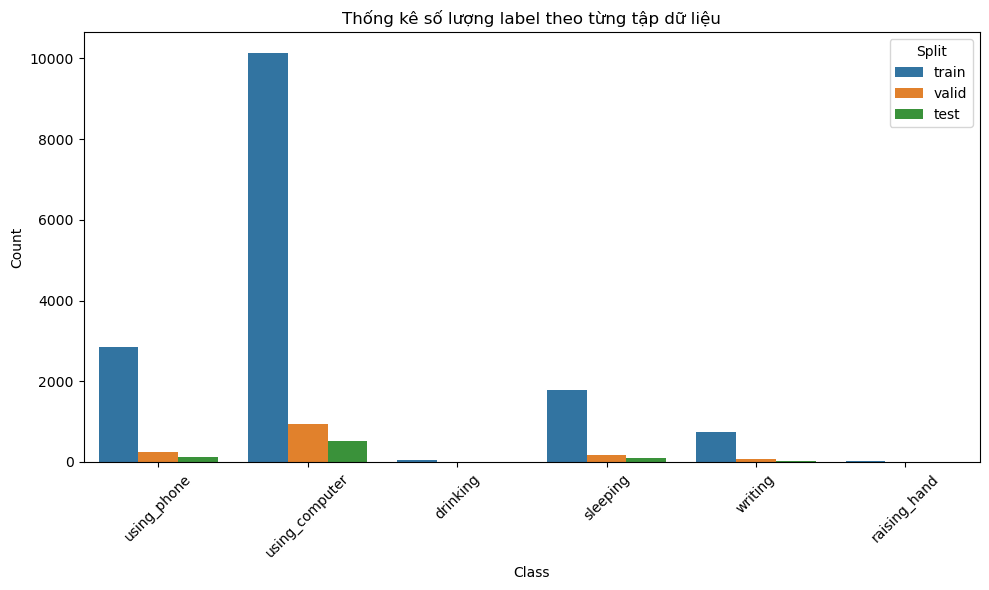

In [21]:
import os
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from collections import defaultdict

def count_labels_in_split(split_dir, class_names):
    """
    Đếm số lượng label theo lớp trong thư mục split (train/valid/test).
    """
    labels_dir = os.path.join(split_dir, "labels")
    counts = defaultdict(int)

    if not os.path.exists(labels_dir):
        print(f"Không tìm thấy thư mục labels tại: {labels_dir}")
        return counts

    for label_file in os.listdir(labels_dir):
        if label_file.lower().endswith(".txt"):
            label_path = os.path.join(labels_dir, label_file)
            with open(label_path, "r", encoding="utf-8") as f:
                for line in f:
                    parts = line.strip().split()
                    if len(parts) < 1:
                        continue
                    try:
                        class_id = int(float(parts[0]))
                        if class_id < len(class_names):
                            counts[class_names[class_id]] += 1
                        else:
                            counts["unknown"] += 1
                    except:
                        counts["invalid"] += 1
    return counts

def count_images_in_split(split_dir):
    """
    Đếm số lượng ảnh trong thư mục split (train/valid/test).
    """
    images_dir = os.path.join(split_dir, "images")
    image_count = 0

    if os.path.exists(images_dir):
        image_count = len([f for f in os.listdir(images_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))])
    
    return image_count

def count_labels_and_images_in_dataset(base_dir, class_names):
    """
    Thống kê số lượng label và ảnh cho từng split: train, valid, test.
    """
    splits = ['train', 'valid', 'test']
    dataset_stats = {}

    for split in splits:
        split_dir = os.path.join(base_dir, split)
        stats = count_labels_in_split(split_dir, class_names)
        num_images = count_images_in_split(split_dir)
        dataset_stats[split] = {"labels": stats, "num_images": num_images}

    return dataset_stats

def generate_summary_table(dataset_stats, class_names):
    """
    Tạo bảng thống kê tổng hợp số lượng Classes, Frequency label, Training Set, Valid Set, Testing Set.
    """
    num_classes = len(class_names)

    # Tính tổng số label xuất hiện trong tất cả splits
    total_label_counts = defaultdict(int)
    for split, data in dataset_stats.items():
        for cls, count in data["labels"].items():
            total_label_counts[cls] += count

    frequency_label = sum(total_label_counts.values())

    # Số lượng ảnh trong từng tập
    training_images = dataset_stats["train"]["num_images"]
    valid_images = dataset_stats["valid"]["num_images"]
    testing_images = dataset_stats["test"]["num_images"]

    # Tổng số labels trong từng tập
    training_labels = sum(dataset_stats["train"]["labels"].values())
    valid_labels = sum(dataset_stats["valid"]["labels"].values())
    testing_labels = sum(dataset_stats["test"]["labels"].values())

    # Tạo DataFrame
    data = [
        ["Classes", num_classes],
        ["Frequency label", frequency_label],
        ["Training labels", training_labels],
        ["Valid labels", valid_labels],
        ["Testing labels", testing_labels],
        ["Training images", training_images],
        ["Valid images", valid_images],
        ["Testing images", testing_images]
    ]
    df = pd.DataFrame(data, columns=["Attribute", "Quantity"])

    return df

def visualize_stats(dataset_stats):
    """
    Trực quan hóa số lượng label của các split bằng biểu đồ cột.
    """
    data = []
    for split, stats in dataset_stats.items():
        for cls, count in stats["labels"].items():
            data.append({
                "Split": split,
                "Class": cls,
                "Count": count
            })

    df = pd.DataFrame(data)

    plt.figure(figsize=(10, 6))
    sns.barplot(data=df, x="Class", y="Count", hue="Split")
    plt.title("Thống kê số lượng label theo từng tập dữ liệu")
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

# ------------------ Chạy thống kê ------------------
if __name__ == "__main__":
    # Đường dẫn thư mục dataset
    base_dir = "/home/minhnv/Documents/ntt/AiIot/FinalPorject/CodingYOLOv12/Dataset/Student-Behavior-Recognition-5"
    
    # Danh sách các lớp
    class_names = ['drinking', 'raising_hand', 'sleeping', 'using_computer', 'using_phone', 'writing']

    # Tính toán thống kê dataset
    dataset_stats = count_labels_and_images_in_dataset(base_dir, class_names)

    # Hiển thị bảng tổng hợp
    summary_table = generate_summary_table(dataset_stats, class_names)
    print(summary_table)

    # Hiển thị trực quan bằng biểu đồ
    visualize_stats(dataset_stats)
